In [ ]:
import sys
sys.path.append('../..')

from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from itertools import chain
from sklearn.model_selection import train_test_split
import importlib
import utils
importlib.reload(utils)
from utils import get_patches, view_sample_images
import pca_iteration
importlib.reload(pca_iteration)
from pca_iteration import run_pca_iteration

## Preparación de los datos

### Rostros

In [13]:
# Obtener rostros (positive patches)
faces = get_patches(zip_path='../../../content/Faces.zip', patches_path = '../../../content/faces_patches')

# Shape, dtype, min, max
print(f'{ faces.shape = }, {faces.dtype=}, {faces.min()=}, {faces.max()=}')

Loading images:   0%|          | 0/12833 [00:00<?, ?it/s]

Loading images: 100%|██████████| 12833/12833 [00:00<00:00, 21206.25it/s]

 faces.shape = (12833, 64, 64), faces.dtype=dtype('uint8'), faces.min()=np.uint8(0), faces.max()=np.uint8(255)


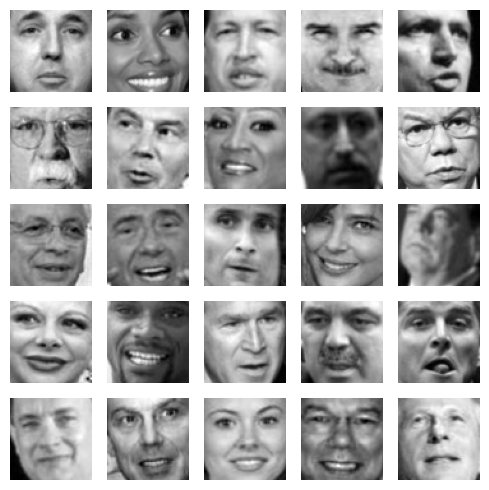

In [14]:
# Visualizamos una muestra
view_sample_images(faces, 25, figsize=(5, 5))

### Fondos

In [15]:
# Obtener fondos (negative patches)
backgrounds = get_patches(zip_path='../../../content/Backgrounds_original.zip', patches_path = '../../../content/background_patches_original')

# Shape, dtype, min, max
print(f'{ backgrounds.shape = }, {backgrounds.dtype=}, {backgrounds.min()=}, {backgrounds.max()=}')

Loading images: 100%|██████████| 12800/12800 [00:03<00:00, 3321.86it/s]

 backgrounds.shape = (12800, 64, 64), backgrounds.dtype=dtype('uint8'), backgrounds.min()=np.uint8(0), backgrounds.max()=np.uint8(255)


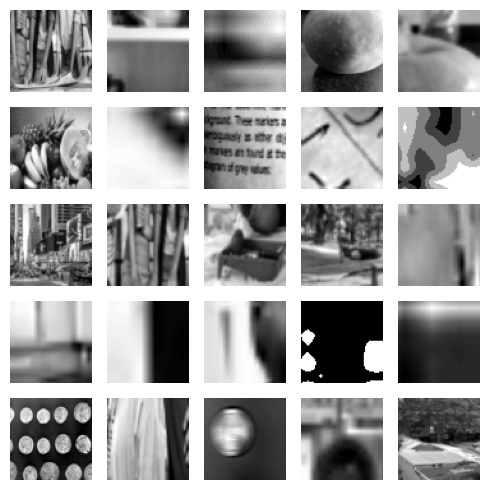

In [16]:
# Visualizamos una muestra
view_sample_images(backgrounds, 25, figsize=(5, 5))

## PCA

In [17]:
X = np.array([im.flatten() for im in tqdm(chain(faces, backgrounds), desc='Construyendo X')])
y = np.zeros(len(X), dtype=int)
y[:len(faces)] = 1

Construyendo X: 25633it [00:00, 436296.40it/s]


In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'{ X_train.shape = }, {X_train.dtype=}, {X_train.min()=}, {X_train.max()=}')

 X_train.shape = (20506, 4096), X_train.dtype=dtype('uint8'), X_train.min()=np.uint8(0), X_train.max()=np.uint8(255)


In [19]:
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)

In [42]:
import seaborn as sns
print(sns.color_palette())


[(0.8862745098039215, 0.2901960784313726, 0.2), (0.20392156862745098, 0.5411764705882353, 0.7411764705882353), (0.596078431372549, 0.5568627450980392, 0.8352941176470589), (0.4666666666666667, 0.4666666666666667, 0.4666666666666667), (0.984313725490196, 0.7568627450980392, 0.3686274509803922), (0.5568627450980392, 0.7294117647058823, 0.25882352941176473), (1.0, 0.7098039215686275, 0.7215686274509804)]



Running experiment with n_components = 20
Suffix: x1_v1_20
Explained variance ratio: 0.8147
Tarea 2


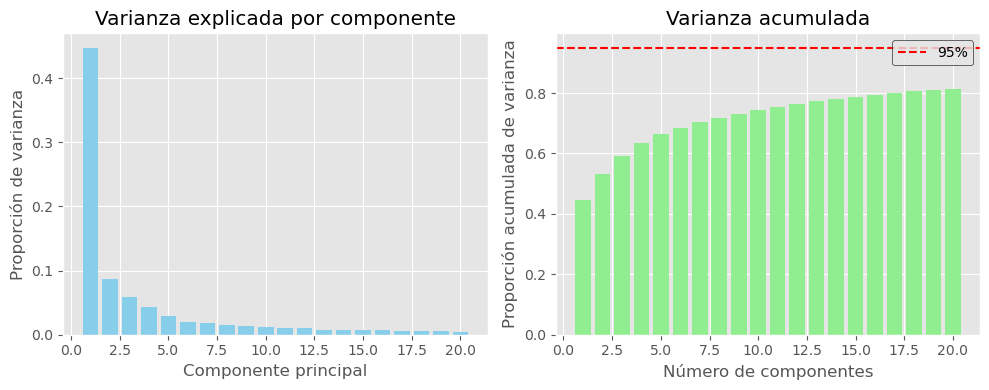

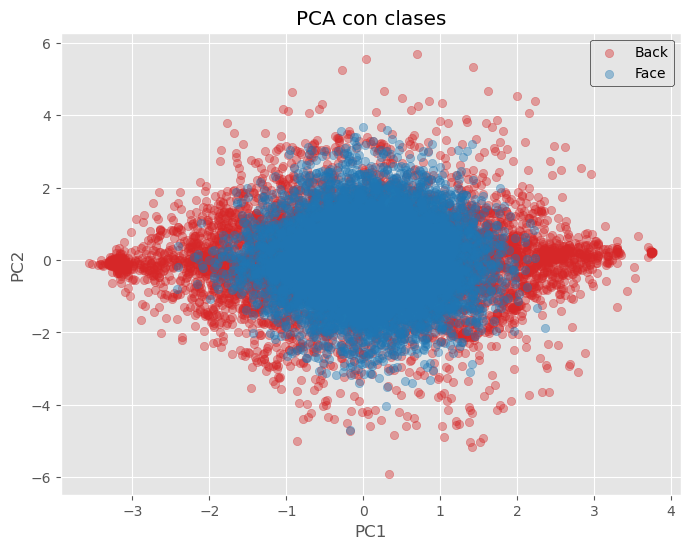

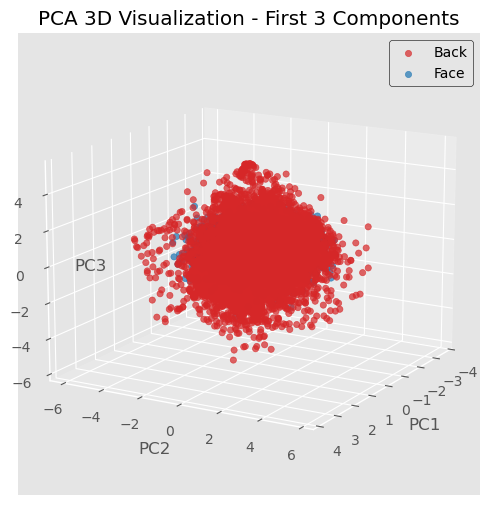

<Figure size 1200x1000 with 0 Axes>

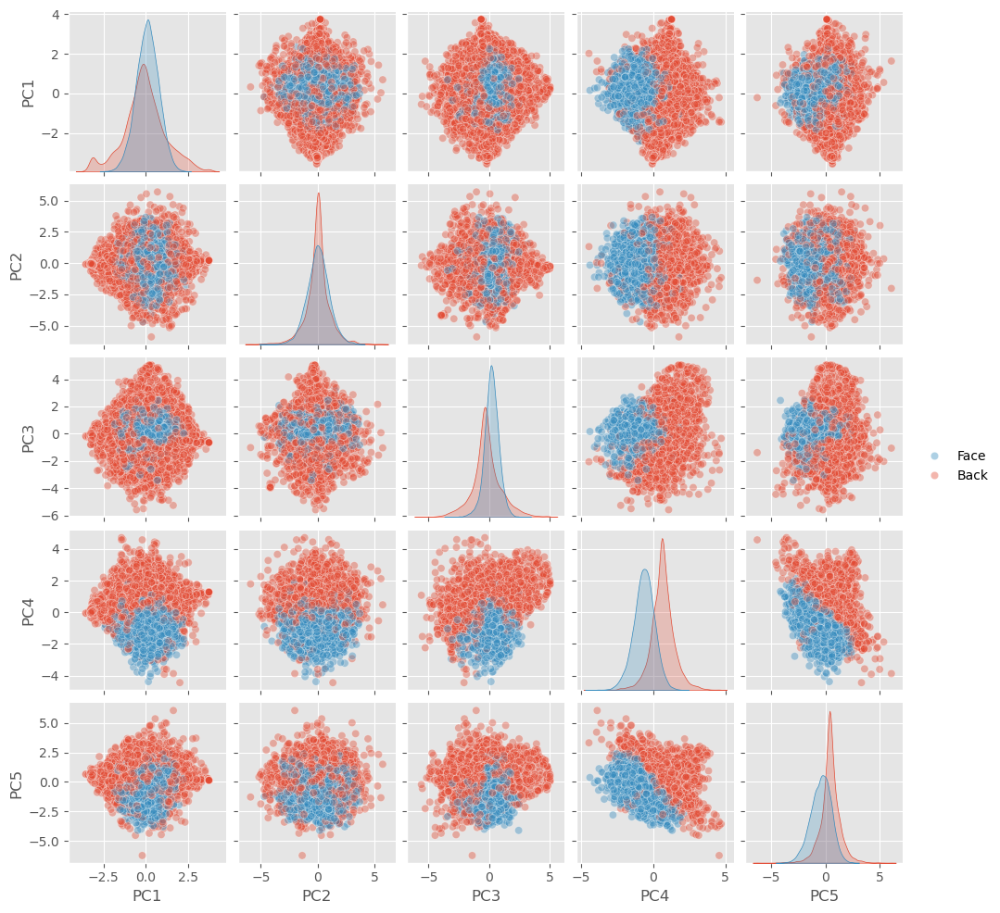


Training Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.81      0.86     10273
           1       0.83      0.93      0.87     10233

    accuracy                           0.87     20506
   macro avg       0.87      0.87      0.87     20506
weighted avg       0.87      0.87      0.87     20506


Test Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.80      0.85      2527
           1       0.82      0.93      0.87      2600

    accuracy                           0.86      5127
   macro avg       0.87      0.86      0.86      5127
weighted avg       0.87      0.86      0.86      5127


Experiment x1_v1_20 completed!
Explained Variance: 0.8147
Train F1: 0.8652
Test F1: 0.8626

Running experiment with n_components = 50
Suffix: x1_v1_50
Explained variance ratio: 0.8887
Tarea 2


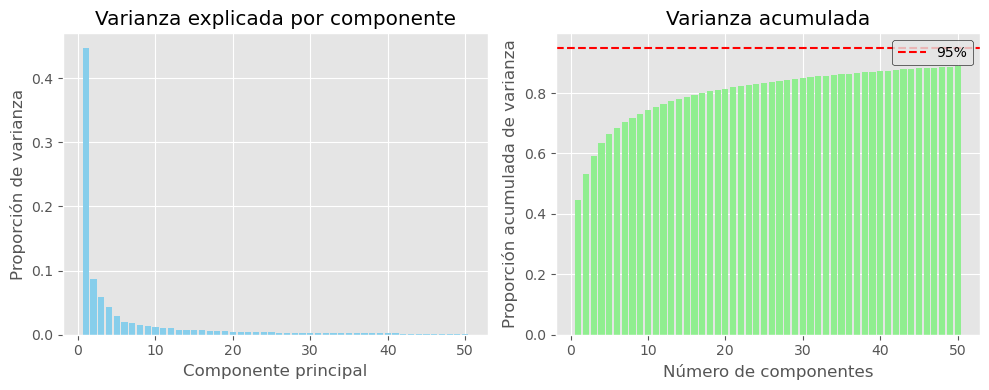

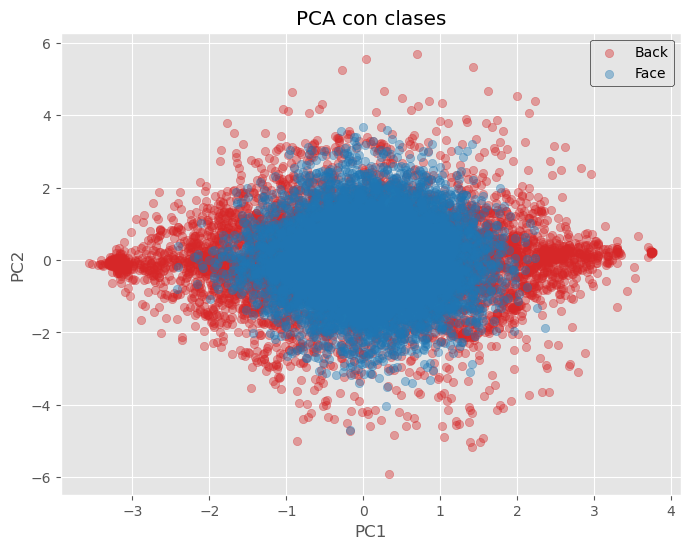

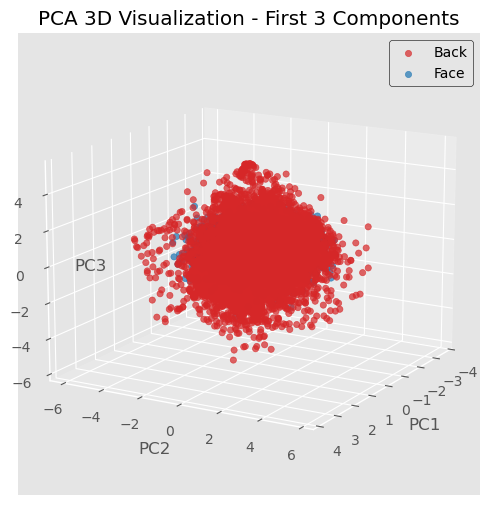

<Figure size 1200x1000 with 0 Axes>

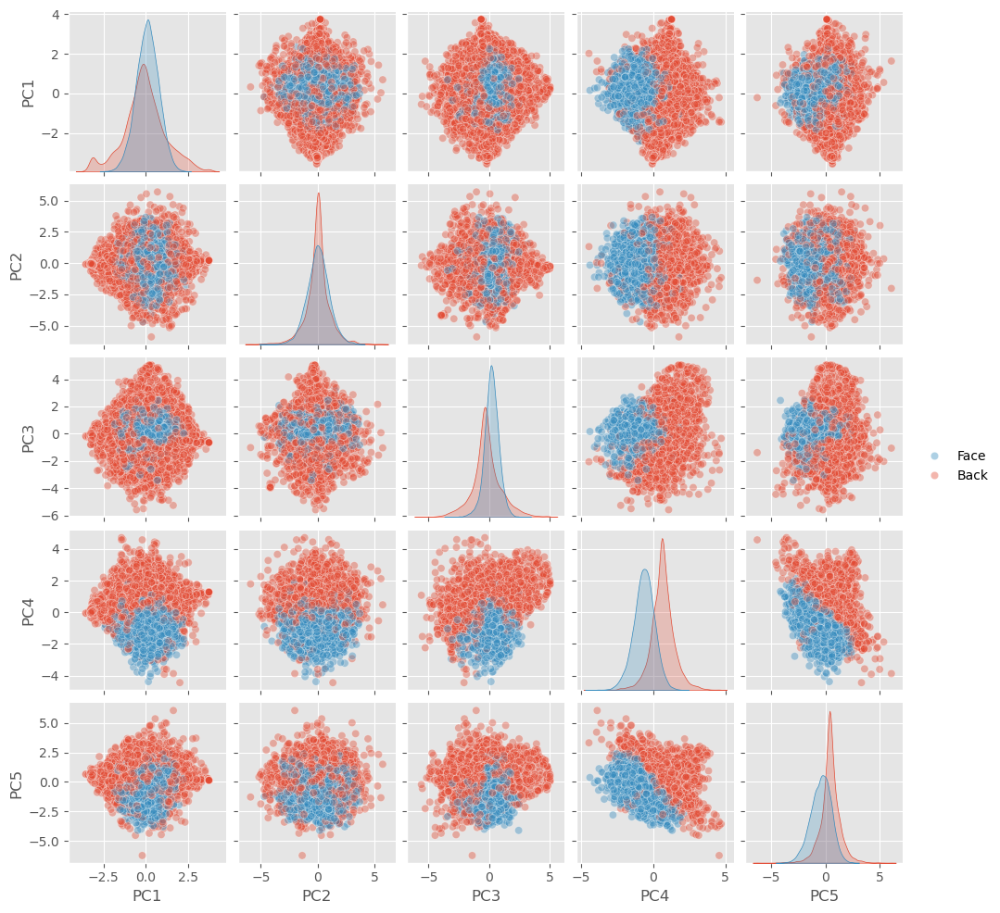


Training Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.83      0.87     10273
           1       0.84      0.93      0.88     10233

    accuracy                           0.88     20506
   macro avg       0.88      0.88      0.87     20506
weighted avg       0.88      0.88      0.87     20506


Test Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.81      0.86      2527
           1       0.84      0.92      0.88      2600

    accuracy                           0.87      5127
   macro avg       0.87      0.87      0.87      5127
weighted avg       0.87      0.87      0.87      5127


Experiment x1_v1_50 completed!
Explained Variance: 0.8887
Train F1: 0.8748
Test F1: 0.8685

Running experiment with n_components = 100
Suffix: x1_v1_100
Explained variance ratio: 0.9322
Tarea 2


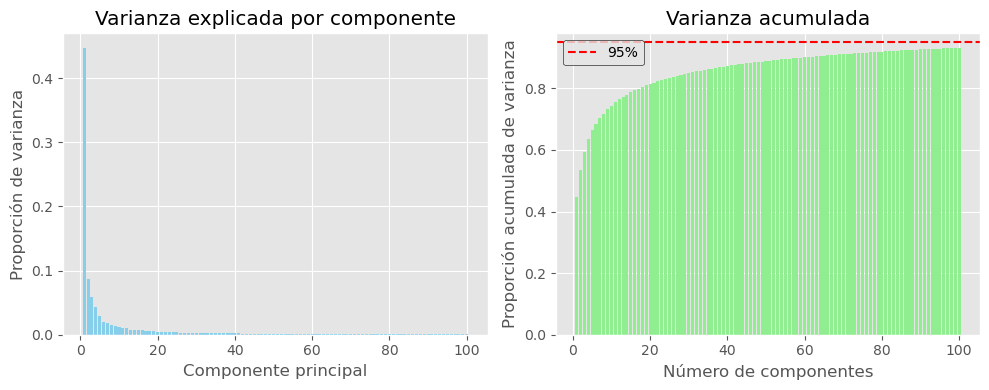

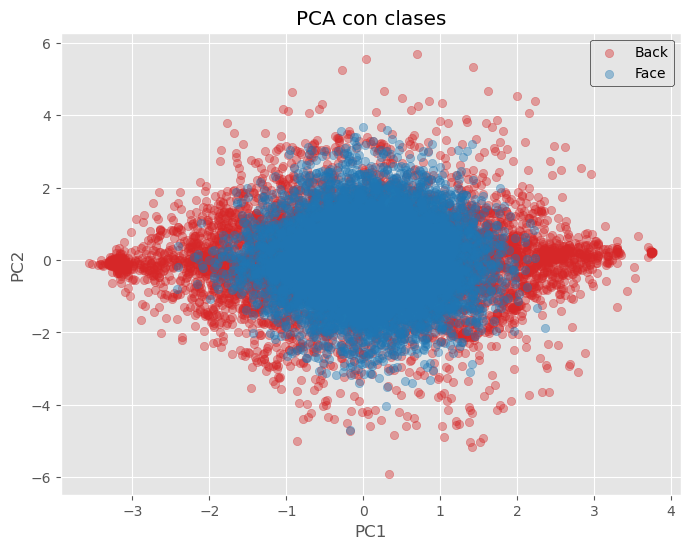

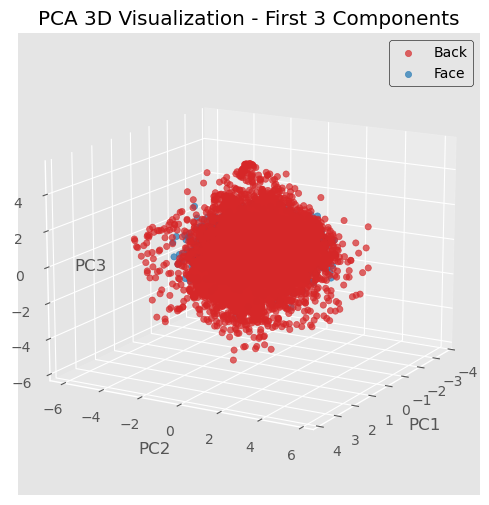

<Figure size 1200x1000 with 0 Axes>

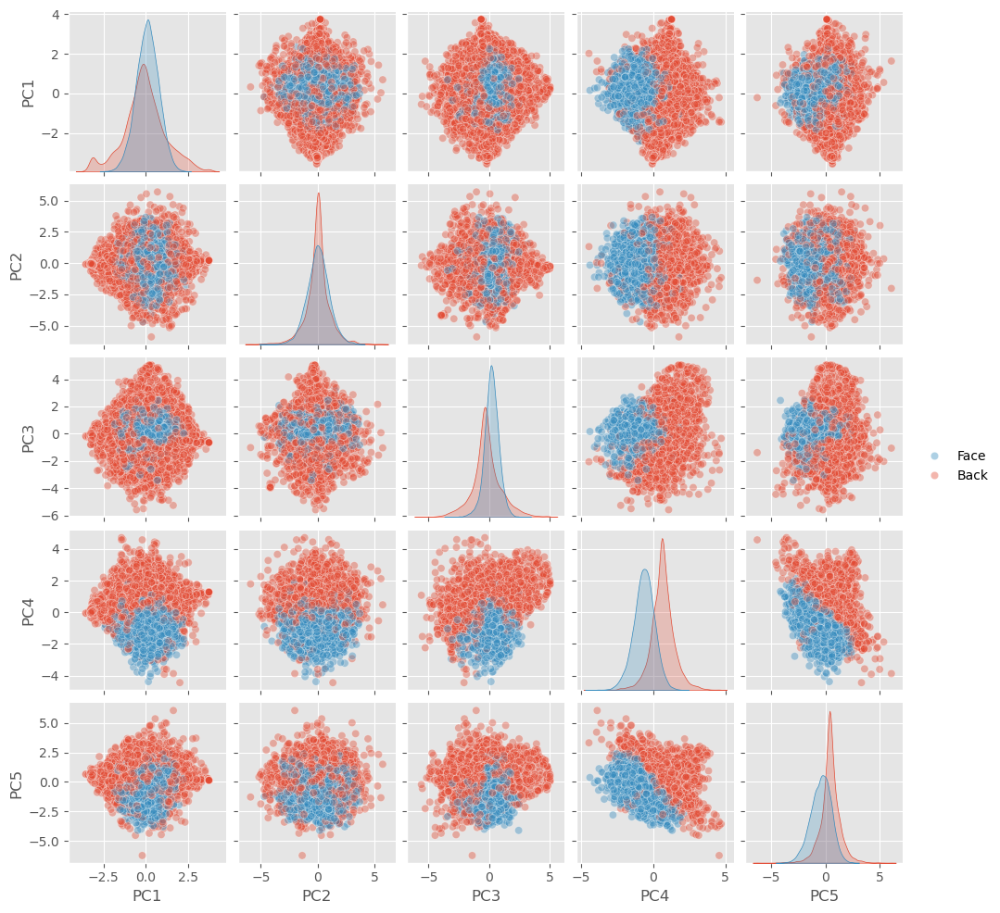


Training Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     10273
           1       0.93      0.93      0.93     10233

    accuracy                           0.93     20506
   macro avg       0.93      0.93      0.93     20506
weighted avg       0.93      0.93      0.93     20506


Test Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2527
           1       0.93      0.93      0.93      2600

    accuracy                           0.93      5127
   macro avg       0.93      0.93      0.93      5127
weighted avg       0.93      0.93      0.93      5127


Experiment x1_v1_100 completed!
Explained Variance: 0.9322
Train F1: 0.9328
Test F1: 0.9317

Running experiment with n_components = 200
Suffix: x1_v1_200
Explained variance ratio: 0.9635
Tarea 2


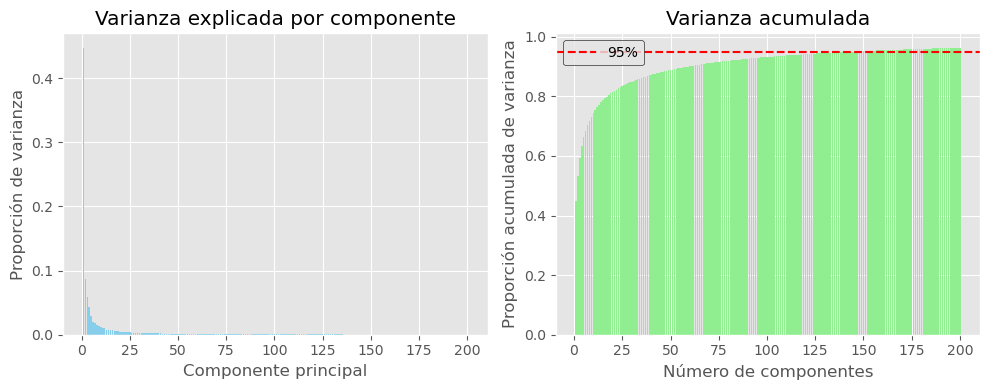

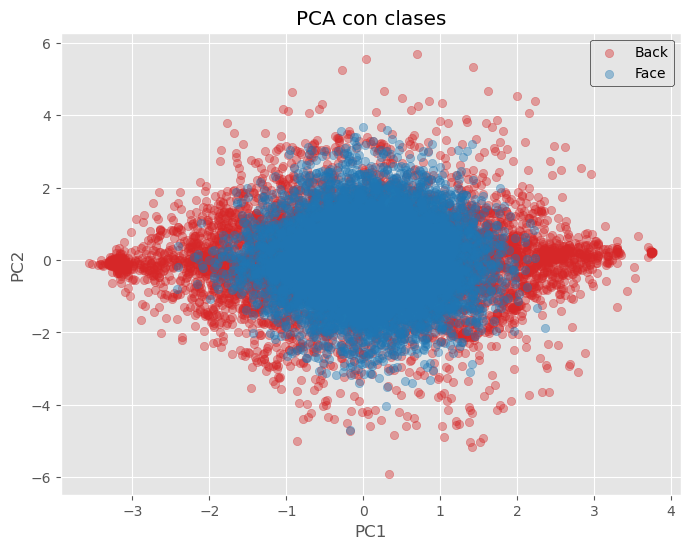

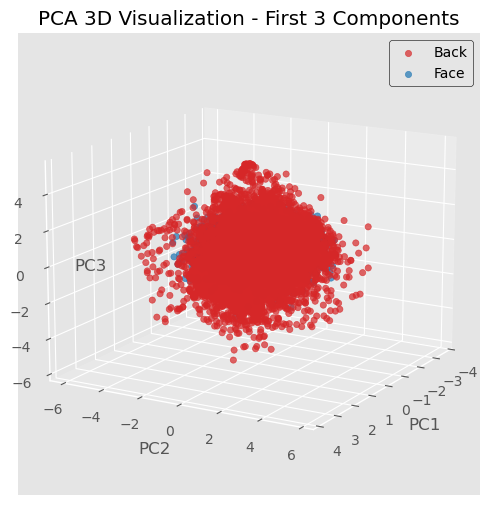

<Figure size 1200x1000 with 0 Axes>

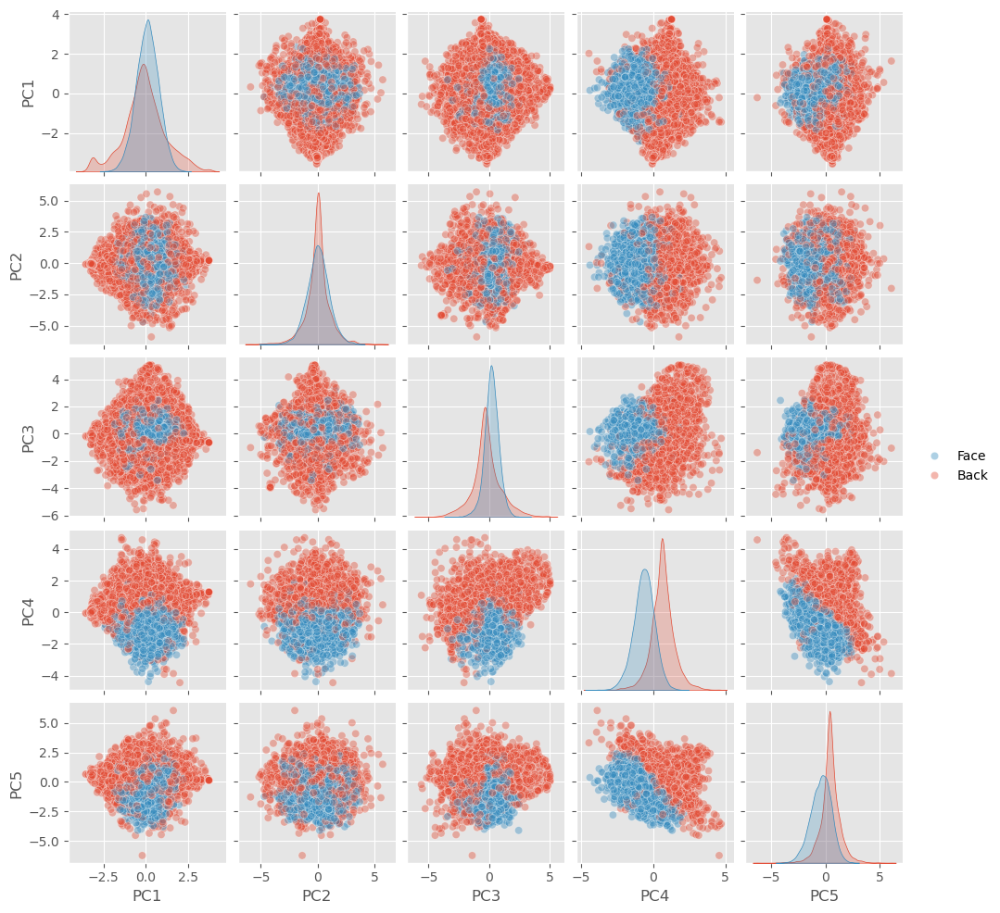


Training Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     10273
           1       0.82      0.93      0.87     10233

    accuracy                           0.86     20506
   macro avg       0.87      0.86      0.86     20506
weighted avg       0.87      0.86      0.86     20506


Test Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.78      0.84      2527
           1       0.81      0.92      0.86      2600

    accuracy                           0.85      5127
   macro avg       0.86      0.85      0.85      5127
weighted avg       0.86      0.85      0.85      5127


Experiment x1_v1_200 completed!
Explained Variance: 0.9635
Train F1: 0.8600
Test F1: 0.8510

Running experiment with n_components = 500
Suffix: x1_v1_500
Explained variance ratio: 0.9876
Tarea 2


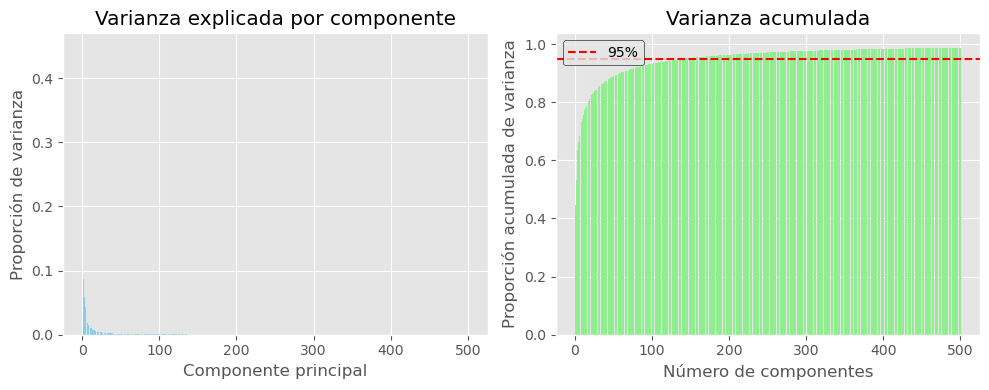

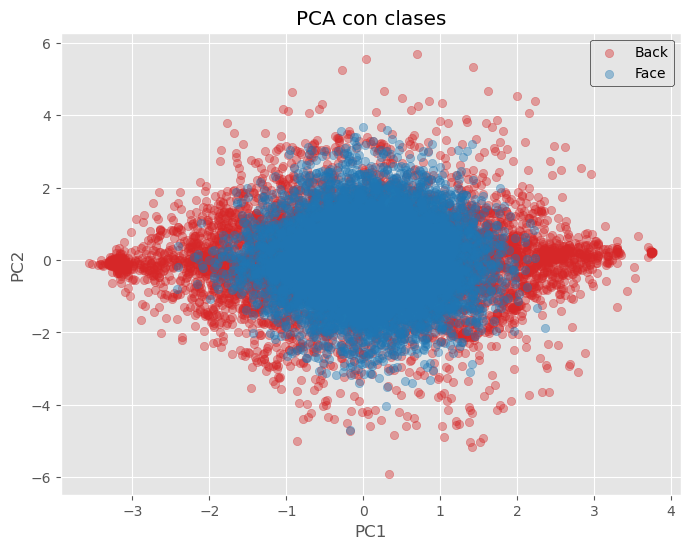

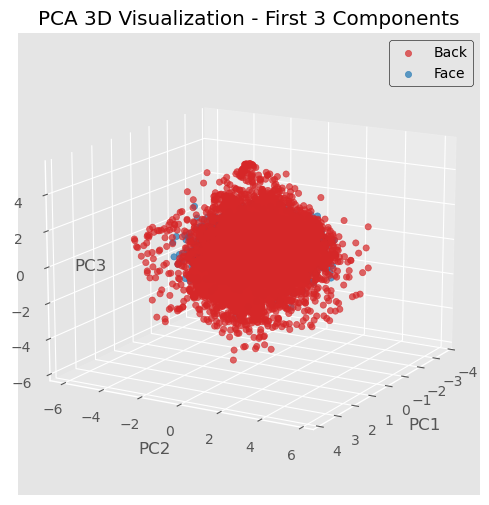

<Figure size 1200x1000 with 0 Axes>

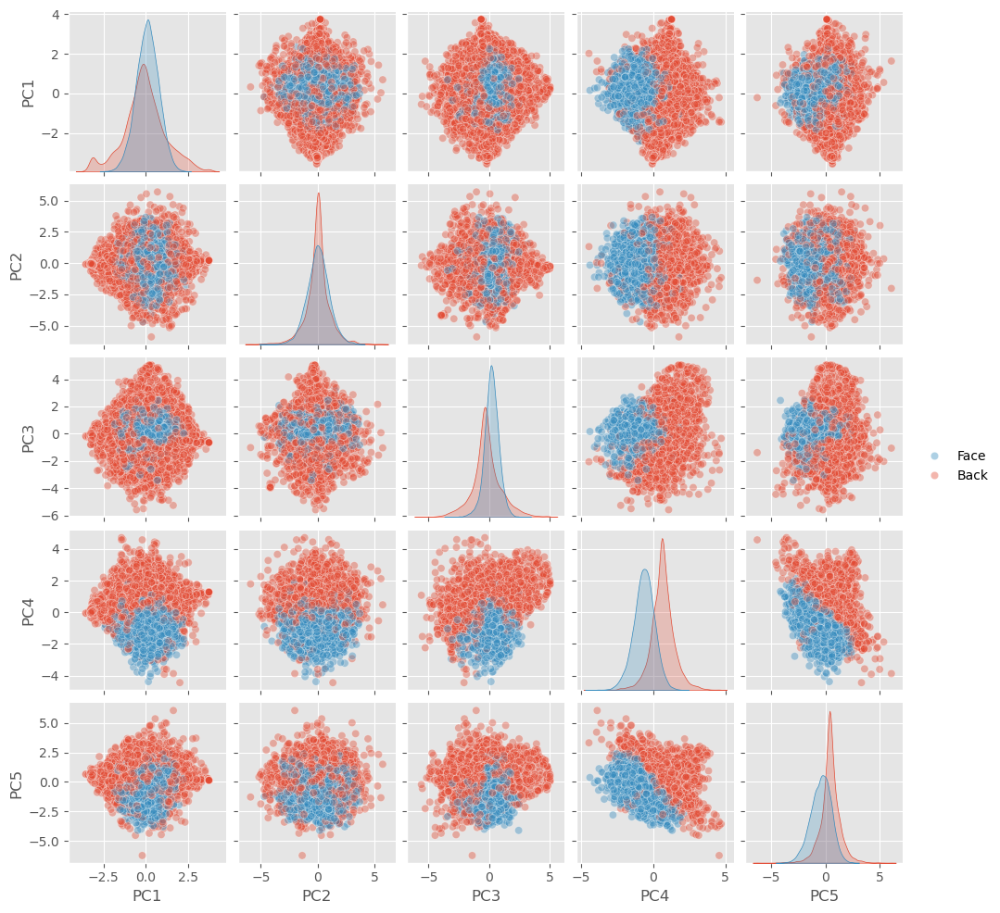


Training Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.41      0.51     10273
           1       0.57      0.79      0.66     10233

    accuracy                           0.60     20506
   macro avg       0.61      0.60      0.58     20506
weighted avg       0.61      0.60      0.58     20506


Test Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.39      0.48      2527
           1       0.57      0.77      0.65      2600

    accuracy                           0.59      5127
   macro avg       0.60      0.58      0.57      5127
weighted avg       0.60      0.59      0.57      5127


Experiment x1_v1_500 completed!
Explained Variance: 0.9876
Train F1: 0.5838
Test F1: 0.5686


In [ ]:
# PCA
n_components_list = [20, 50, 100, 200, 500]

results = run_pca_iteration(
    X_train_std=X_train_std,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    scaler=scaler,
    n_components_list=n_components_list,
    ratio='x1',
)

### Fondos x2

In [46]:
# Obtener fondos (negative patches)
RATIO = "x2_v1"
SUFFIX = f'_{RATIO}'  # Sufijo para los parches de fondo
backgrounds = get_patches(zip_path=f'../../../content/Backgrounds{SUFFIX}.zip', patches_path = f'../../../content/background_patches{SUFFIX}')

# Shape, dtype, min, max
print(f'{ backgrounds.shape = }, {backgrounds.dtype=}, {backgrounds.min()=}, {backgrounds.max()=}')

Loading images: 100%|██████████| 25666/25666 [00:08<00:00, 3022.06it/s]


 backgrounds.shape = (25666, 64, 64), backgrounds.dtype=dtype('uint8'), backgrounds.min()=np.uint8(0), backgrounds.max()=np.uint8(255)


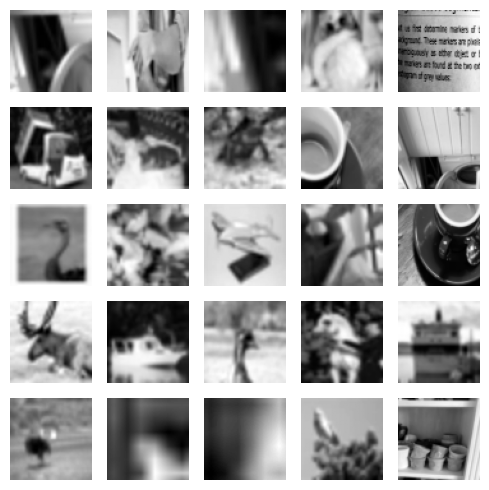

In [47]:
# Visualizamos una muestra
view_sample_images(backgrounds, 25, figsize=(5, 5))

In [48]:
X = np.array([im.flatten() for im in tqdm(chain(faces, backgrounds), desc='Construyendo X')])
y = np.zeros(len(X), dtype=int)
y[:len(faces)] = 1

Construyendo X: 38499it [00:00, 245175.50it/s]


In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'{ X_train.shape = }, {X_train.dtype=}, {X_train.min()=}, {X_train.max()=}')

 X_train.shape = (30799, 4096), X_train.dtype=dtype('uint8'), X_train.min()=np.uint8(0), X_train.max()=np.uint8(255)


In [50]:
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)


Running experiment with n_components = 20
Suffix: x2_v1_20
Explained variance ratio: 0.8079
Tarea 2


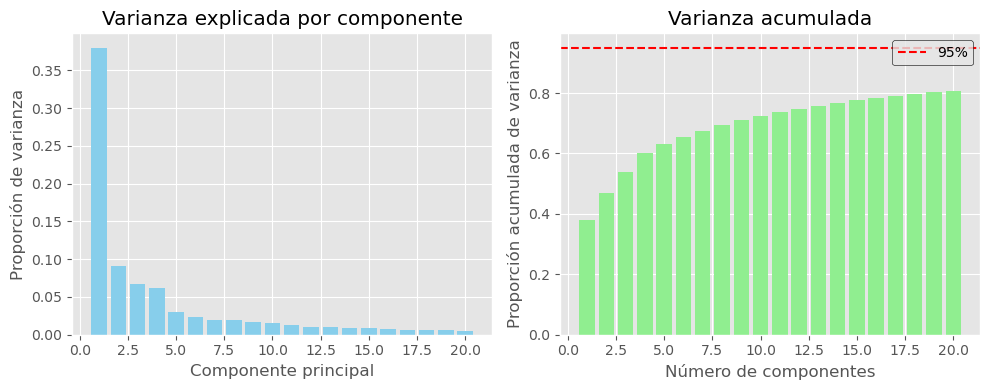

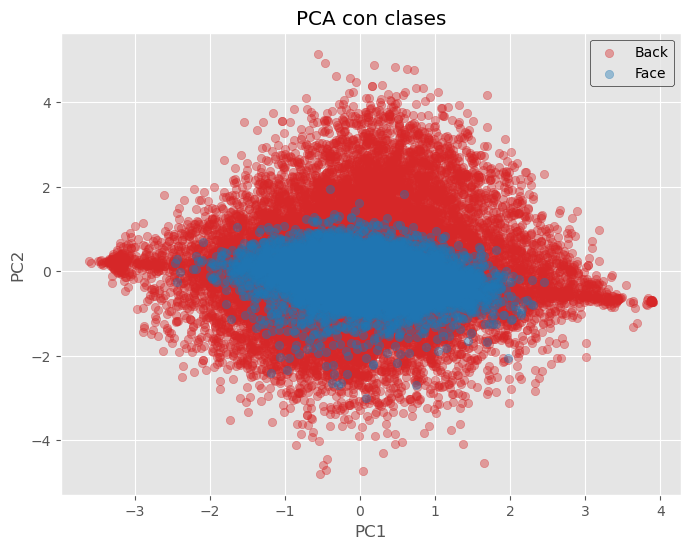

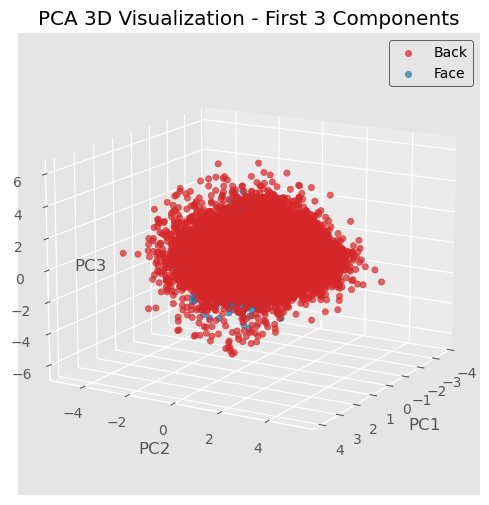

<Figure size 1200x1000 with 0 Axes>

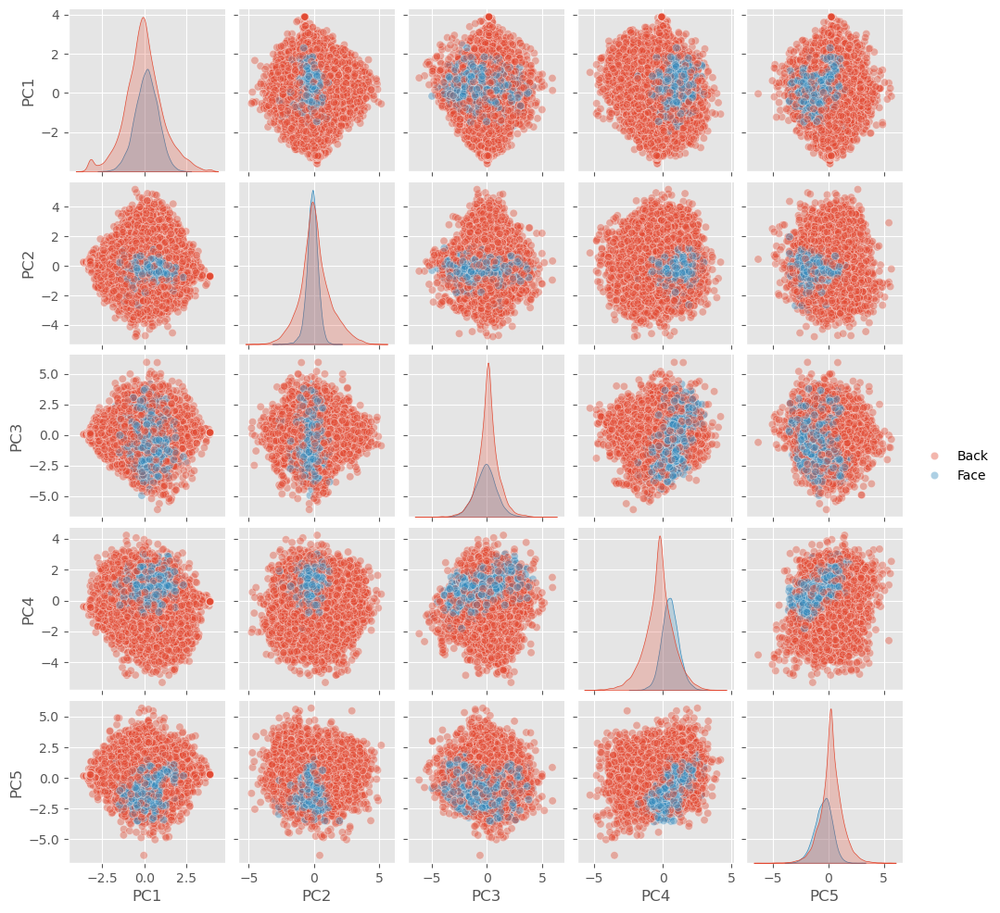


Training Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.87      0.90     20549
           1       0.77      0.89      0.83     10250

    accuracy                           0.88     30799
   macro avg       0.86      0.88      0.86     30799
weighted avg       0.88      0.88      0.88     30799


Test Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.87      0.90      5117
           1       0.78      0.88      0.83      2583

    accuracy                           0.88      7700
   macro avg       0.86      0.88      0.87      7700
weighted avg       0.88      0.88      0.88      7700


Experiment x2_v1_20 completed!
Explained Variance: 0.8079
Train F1: 0.8643
Test F1: 0.8664

Running experiment with n_components = 50
Suffix: x2_v1_50
Explained variance ratio: 0.8906
Tarea 2


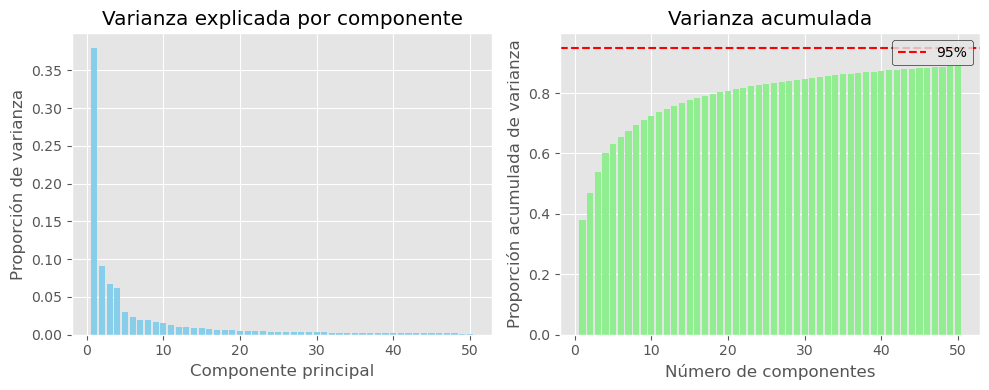

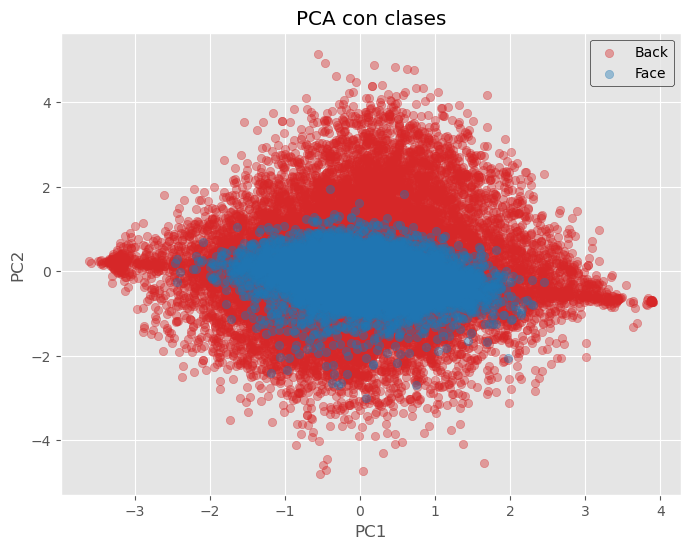

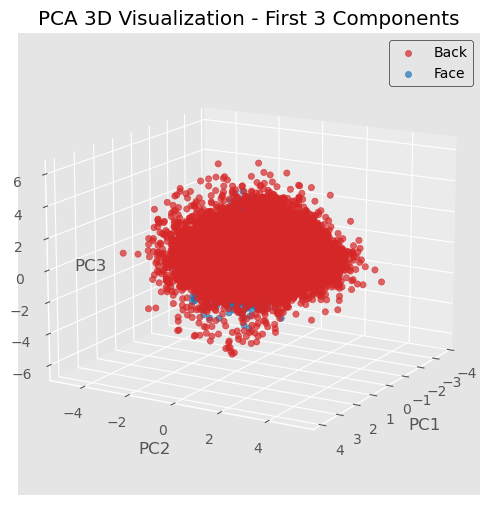

<Figure size 1200x1000 with 0 Axes>

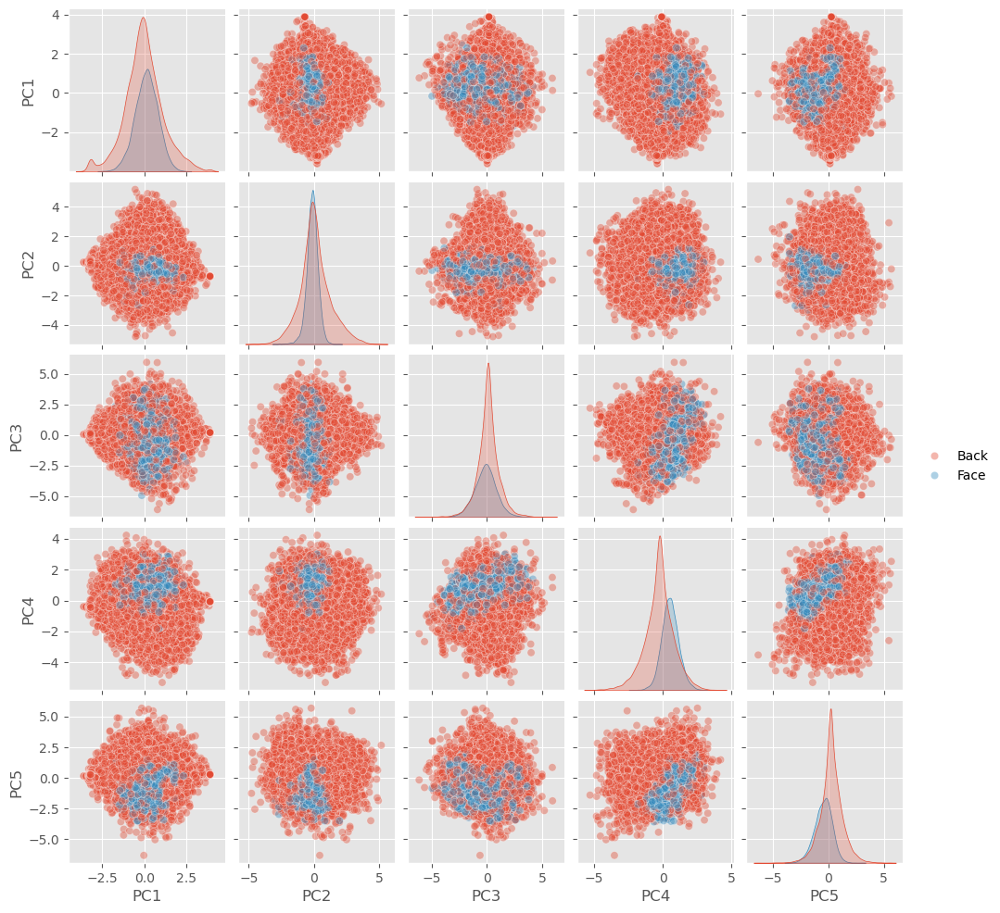


Training Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84     20549
           1       0.66      0.86      0.75     10250

    accuracy                           0.80     30799
   macro avg       0.79      0.82      0.79     30799
weighted avg       0.83      0.80      0.81     30799


Test Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.78      0.84      5117
           1       0.66      0.85      0.74      2583

    accuracy                           0.80      7700
   macro avg       0.79      0.81      0.79      7700
weighted avg       0.83      0.80      0.81      7700


Experiment x2_v1_50 completed!
Explained Variance: 0.8906
Train F1: 0.7937
Test F1: 0.7923

Running experiment with n_components = 100
Suffix: x2_v1_100
Explained variance ratio: 0.9376
Tarea 2


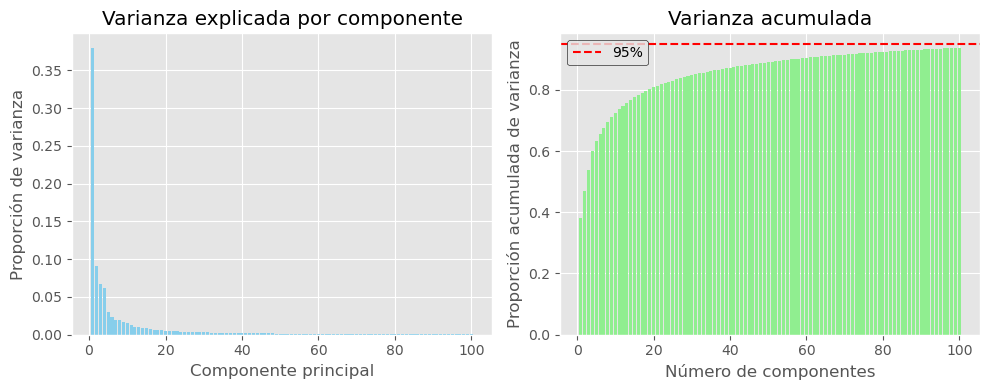

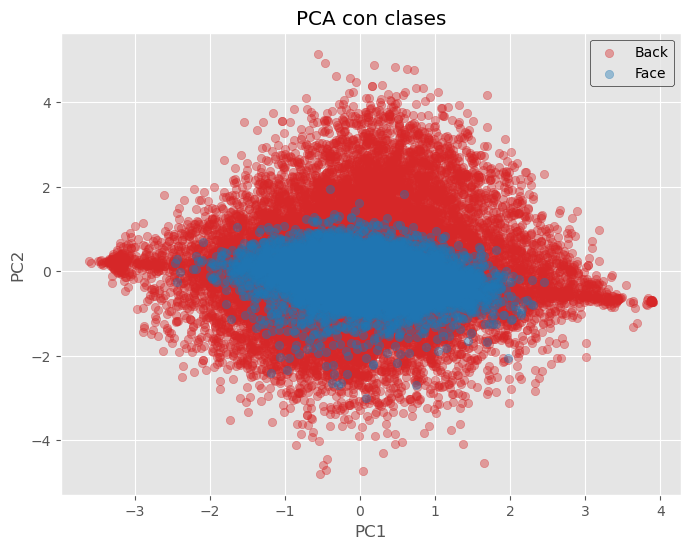

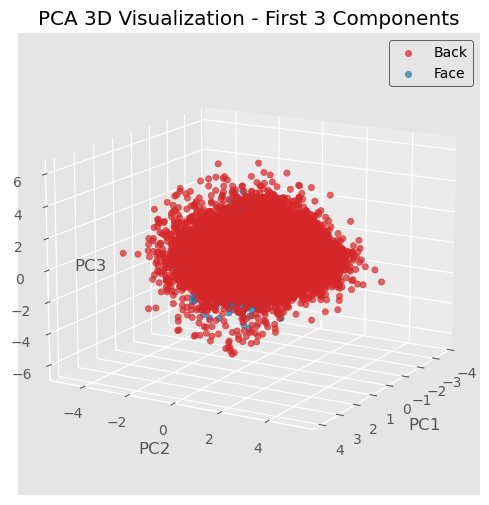

<Figure size 1200x1000 with 0 Axes>

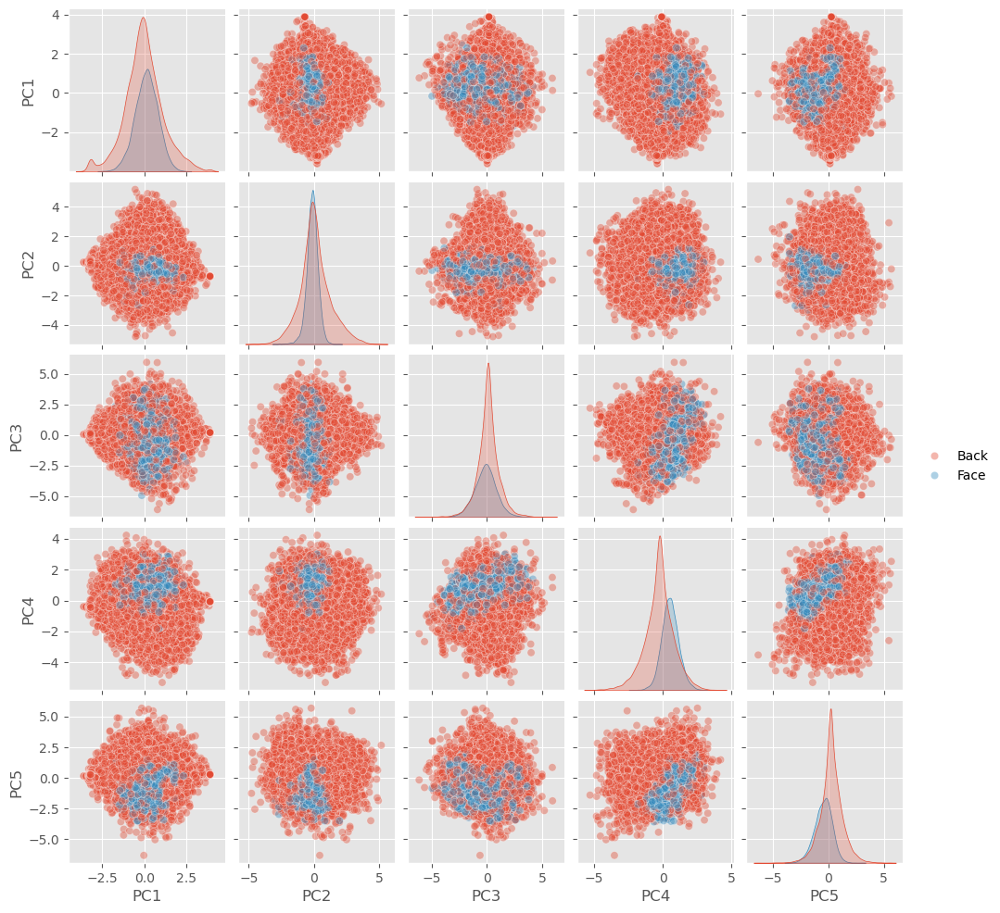


Training Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.73      0.81     20549
           1       0.61      0.84      0.71     10250

    accuracy                           0.77     30799
   macro avg       0.75      0.79      0.76     30799
weighted avg       0.80      0.77      0.77     30799


Test Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.74      0.81      5117
           1       0.61      0.83      0.70      2583

    accuracy                           0.77      7700
   macro avg       0.75      0.78      0.76      7700
weighted avg       0.80      0.77      0.77      7700


Experiment x2_v1_100 completed!
Explained Variance: 0.9376
Train F1: 0.7554
Test F1: 0.7557

Running experiment with n_components = 200
Suffix: x2_v1_200
Explained variance ratio: 0.9698
Tarea 2


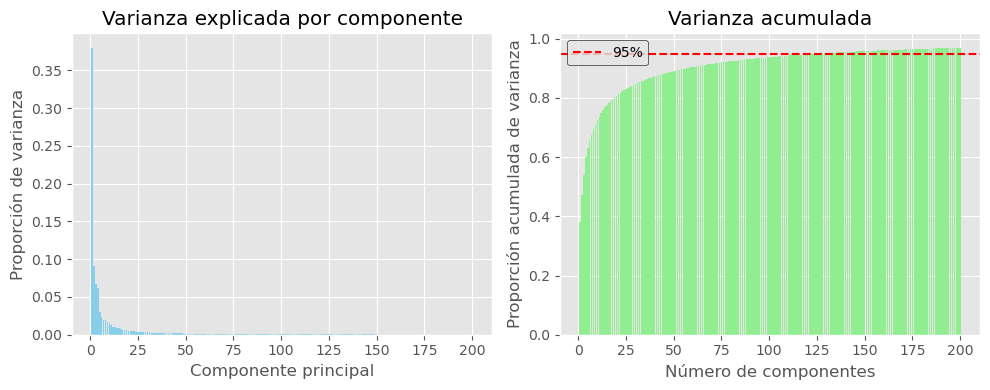

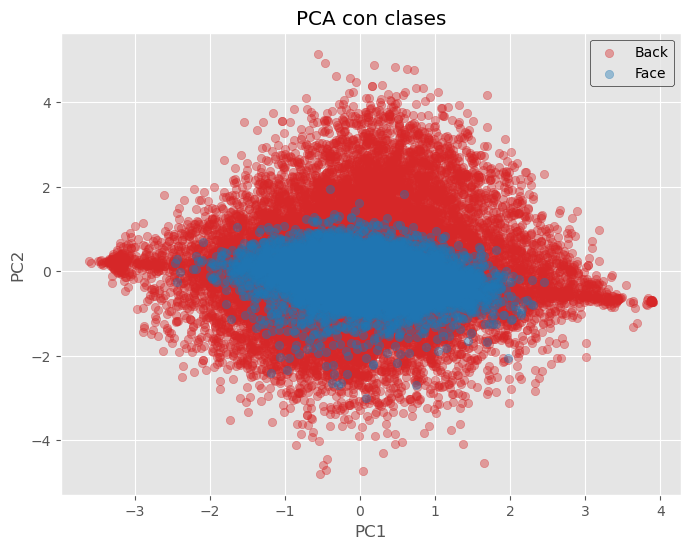

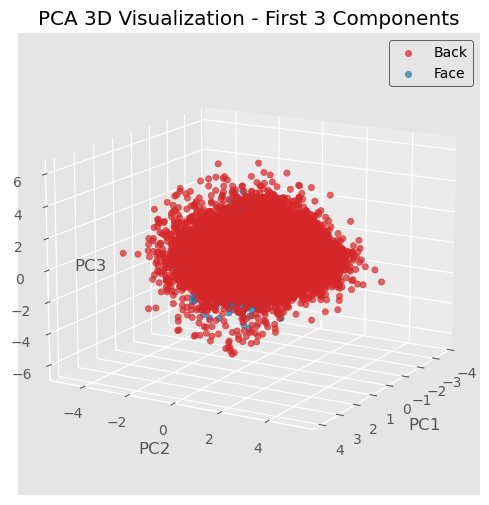

<Figure size 1200x1000 with 0 Axes>

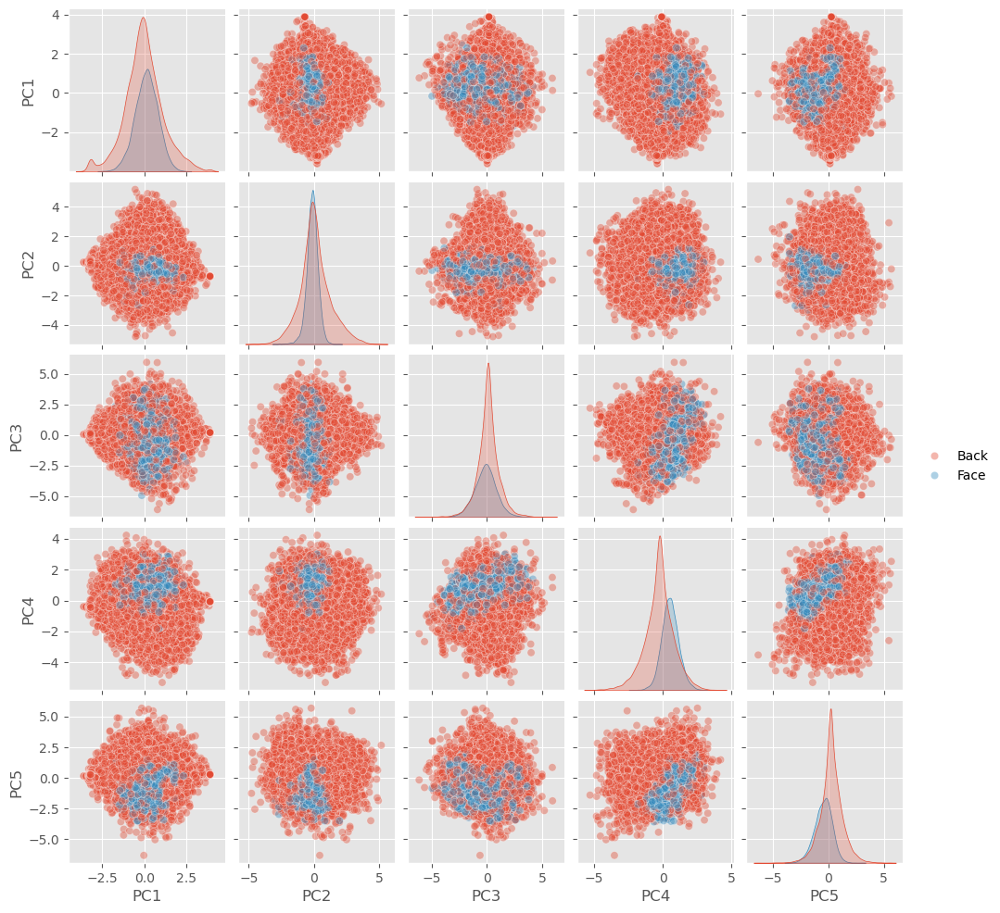


Training Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.67      0.76     20549
           1       0.55      0.81      0.66     10250

    accuracy                           0.72     30799
   macro avg       0.71      0.74      0.71     30799
weighted avg       0.77      0.72      0.73     30799


Test Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.68      0.76      5117
           1       0.56      0.79      0.66      2583

    accuracy                           0.72      7700
   macro avg       0.71      0.74      0.71      7700
weighted avg       0.76      0.72      0.73      7700


Experiment x2_v1_200 completed!
Explained Variance: 0.9698
Train F1: 0.7091
Test F1: 0.7104

Running experiment with n_components = 500
Suffix: x2_v1_500
Explained variance ratio: 0.9914
Tarea 2


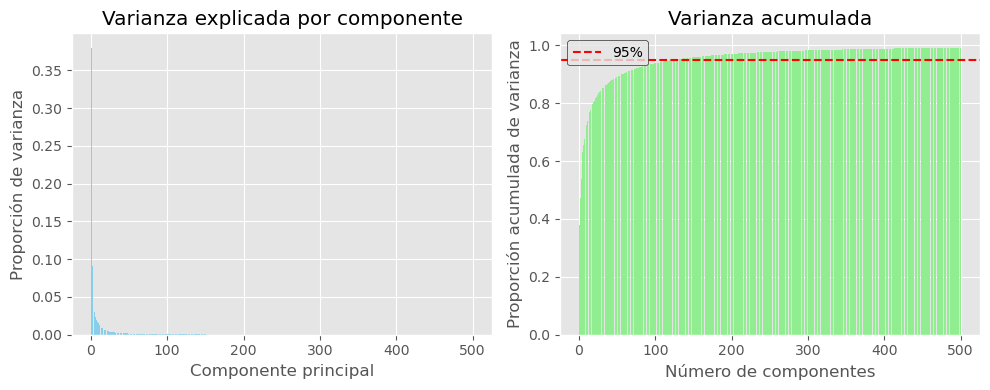

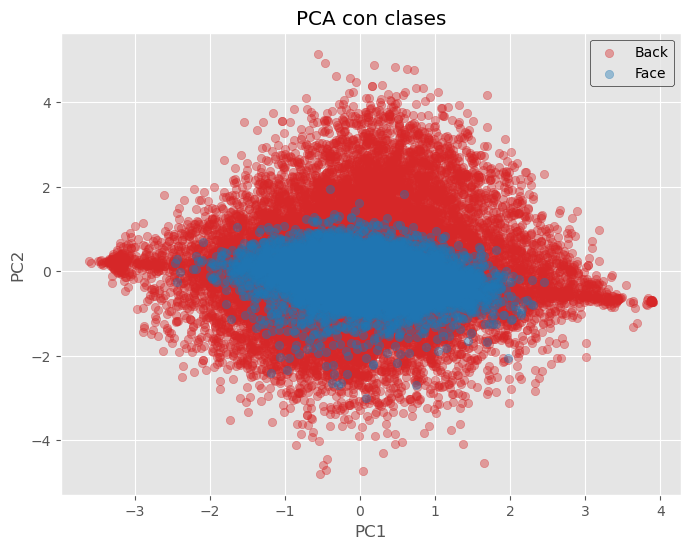

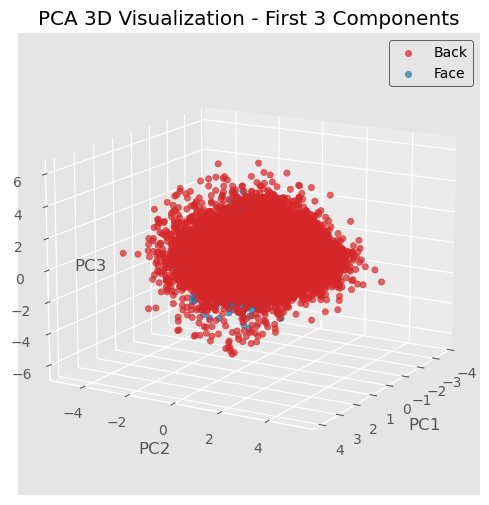

<Figure size 1200x1000 with 0 Axes>

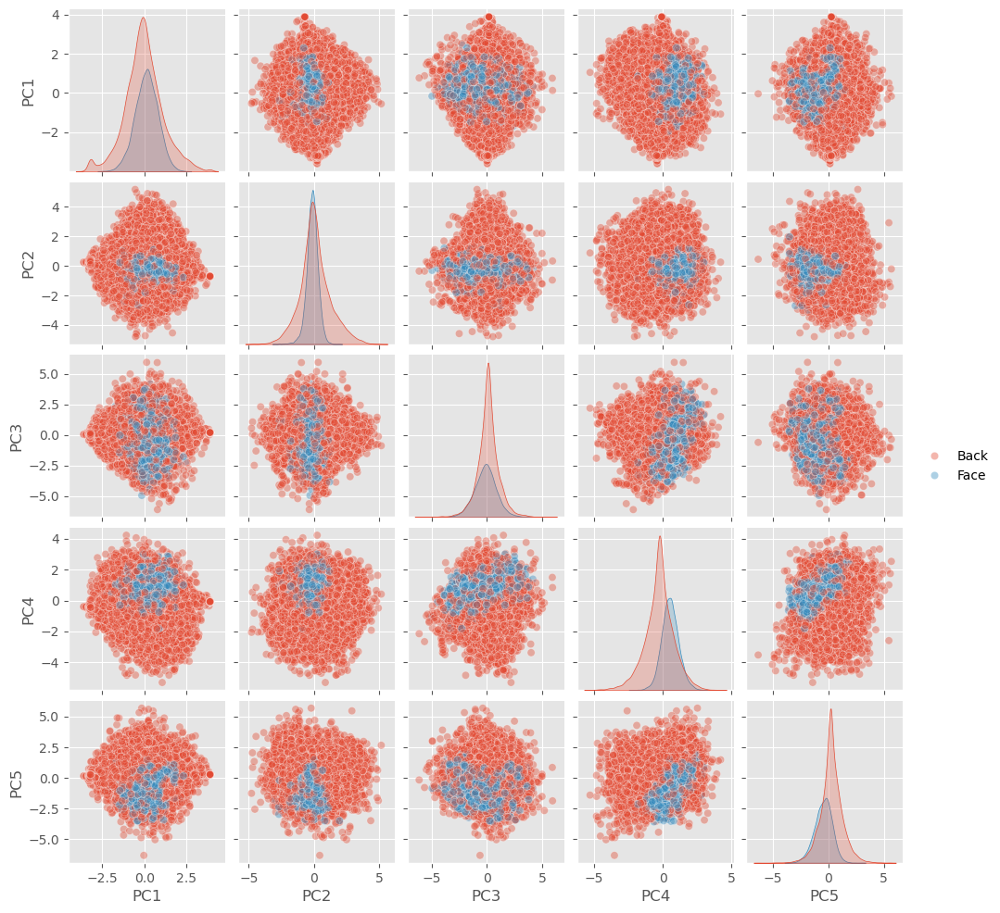


Training Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.69      0.78     20549
           1       0.58      0.85      0.69     10250

    accuracy                           0.74     30799
   macro avg       0.74      0.77      0.73     30799
weighted avg       0.79      0.74      0.75     30799


Test Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.71      0.79      5117
           1       0.59      0.83      0.69      2583

    accuracy                           0.75      7700
   macro avg       0.74      0.77      0.74      7700
weighted avg       0.79      0.75      0.76      7700


Experiment x2_v1_500 completed!
Explained Variance: 0.9914
Train F1: 0.7336
Test F1: 0.7397


In [ ]:
# PCA
n_components_list = [20, 50, 100, 200, 500]

results = run_pca_iteration(
    X_train_std=X_train_std,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    scaler=scaler,
    n_components_list=n_components_list,
    ratio='x2',
)